In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sentence_transformers import SentenceTransformer
from sklearn.metrics.pairwise import cosine_similarity

import json

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import umap

import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

### Load the data, the model and the embeddings:

In [17]:
# This is the already preprocessed recipes:
recipe_data = pd.read_csv('preprocessed_recipe_data.csv')
recipe_data.head()

,title,ingredients,instructions,full_text
0,Awesome Slow Cooker Pot Roast,['2 (1075 ounce) cans condensed cream of mushr...,In a slow cooker mix cream of mushroom soup dr...,recipe title awesome slow cooker pot roast i...
1,Brown Sugar Meatloaf,"['1/2 cup packed brown sugar ', '1/2 cup ketch...",Preheat oven to 350 degrees F (175 degrees C) ...,recipe title brown sugar meatloaf ingredient...
2,Best Chocolate Chip Cookies,"['1 cup butter softened ', '1 cup white sugar ...",Preheat oven to 350 degrees F (175 degrees C)\...,recipe title best chocolate chip cookies ing...
3,Homemade Mac and Cheese Casserole,"['8 ounces whole wheat rotini pasta ', '3 cups...",Preheat oven to 350 degrees F Line a 2quart ca...,recipe title homemade mac cheese casserole i...
4,Banana Banana Bread,"['2 cups allpurpose flour ', '1 teaspoon bakin...",Preheat oven to 350 degrees F (175 degrees C) ...,recipe title banana banana bread ingredients...


In [18]:
# Loading the model:
loaded_model = SentenceTransformer('content/load_model')

In [19]:
# Loading the embedded recipes:
loaded_embeddings = np.load('content/embeddings.npy')

## Test the model:

We are going to test our model by giving the igredients we want to use and then our model will give the most similar recipes by comparing the embedded input to the embedded data with `cosine_similarity`.

#### Cosine similarity:

Cosine similarity is a metric used to measure the similarity between two vectors in a multi-dimensional space. It is particularly popular in natural language processing and information retrieval for comparing the similarity of documents or text data. Cosine similarity calculates the cosine of the angle between two vectors and provides a value between -1 and 1, where:


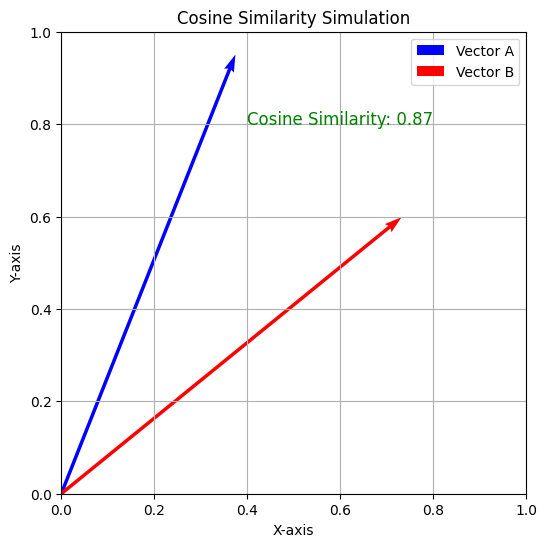

In [20]:
# Generate random vectors
np.random.seed(42)
vector_a = np.random.rand(2)
vector_b = np.random.rand(2)

# Calculate cosine similarity
cosine_sim = cosine_similarity([vector_a], [vector_b])[0, 0]

# Plot the vectors
plt.figure(figsize=(6, 6))
plt.quiver(0, 0, vector_a[0], vector_a[1], angles='xy', scale_units='xy', scale=1, color='blue', label='Vector A')
plt.quiver(0, 0, vector_b[0], vector_b[1], angles='xy', scale_units='xy', scale=1, color='red', label='Vector B')

# Set plot limits
plt.xlim(0, 1)
plt.ylim(0, 1)

# Add labels and legend
plt.title('Cosine Similarity Simulation')
plt.xlabel('X-axis')
plt.ylabel('Y-axis')
plt.legend()

# Display the cosine similarity as text
plt.text(0.4, 0.8, f'Cosine Similarity: {cosine_sim:.2f}', fontsize=12, color='green')

# Show the plot
plt.grid(True)
plt.show()

## Get best matches:

Now we will make a function that will compare the input of the user to the data and will return a dataframe with the best matches:

In [21]:
def combine_columns(df):
    # Combine 'Title', 'Ingredients', and 'Instructions' columns into a new 'Combined_Text' column
    text = 'Title: ' + df['title'] + '. Ingredients: ' + df['ingredients'] + '. Instructions ' + df['instructions']
    
    return text

In [22]:
def get_top_similar_recipes(positive_prompt,negative_prompt, embeddings, original_data, model, top_k=10):
    # 1. Generate embeddings for the input text
    if negative_prompt != ['']:
        positive_prompt = model.encode(positive_prompt)
        negative_prompt = model.encode(negative_prompt)
    
        # Combine the vectors
        user_vector = positive_prompt - negative_prompt
    else:
        user_vector = model.encode(positive_prompt)

    # 2. Calculate similarity scores between the input text and the recipes
    similarity_scores = cosine_similarity(user_vector, embeddings)[0]

    # 3. Rank the recipes based on similarity scores
    ranked_indices = np.argsort(similarity_scores)[::-1][:top_k]

    # 4. Create a new DataFrame with the top similar recipes
    top_similar_df = original_data.iloc[ranked_indices].copy()
    top_similar_df['combined_text'] = combine_columns(recipe_data)
    top_similar_df['cosine_similarity'] = similarity_scores[ranked_indices]
    
    top_similar_df.reset_index(inplace=True)

    # 5. Return the DataFrame with two columns
    return top_similar_df[['combined_text', 'cosine_similarity']]

The function is ready now we have to test it. The way we are going to test it is that we will give some user input and see how good it mathces to what we wanted. First i will try with giving only the title of the recipe and then with the ingredients:


In [23]:
# Let's start with something we all love
positvie_prompt_1 = ['moussaka']
negative_prompt_1 = ['']

top_similar_recipes = get_top_similar_recipes(positive_prompt=positvie_prompt_1, negative_prompt=negative_prompt_1, embeddings=loaded_embeddings, original_data=recipe_data, model=loaded_model)
top_similar_recipes

,combined_text,cosine_similarity
0,Title: Moussaka. Ingredients: ['6 tablespoons ...,0.606434
1,Title: Moussaka. Ingredients: ['3 eggplants pe...,0.605806
2,Title: Moussaka. Ingredients: ['3 medium or 2 ...,0.603505
3,Title: Moussaka. Ingredients: ['3 large eggpla...,0.602765
4,Title: Moussaka. Ingredients: ['1/4 cup dried ...,0.593986
5,Title: Croatian Moussaka . Ingredients: ['2 lb...,0.584201
6,Title: Moussaka. Ingredients: ['2 eggplants sl...,0.571822
7,Title: Moussaka. Ingredients: ['2 large eggpla...,0.568119
8,Title: Moussaka Cottage Pie. Ingredients: ['4 ...,0.526536
9,Title: Beef Moussaka. Ingredients: ['Cooking s...,0.526354


In [24]:
positvie_prompt_2 = ['spaghetti and meatballs']
negative_prompt_2 = ['']

top_similar_recipes = get_top_similar_recipes(positive_prompt=positvie_prompt_2, negative_prompt=negative_prompt_2, embeddings=loaded_embeddings, original_data=recipe_data, model=loaded_model)
top_similar_recipes

,combined_text,cosine_similarity
0,Title: Spaghetti with Meatballs. Ingredients: ...,0.657629
1,Title: Our Favorite Spaghetti and Meatballs . ...,0.654685
2,Title: Spaghetti and Meatballs . Ingredients: ...,0.647166
3,Title: Spaghetti and Meatballs . Ingredients: ...,0.644409
4,Title: Jenns Out Of This World Spaghetti and M...,0.642714
5,Title: Lighter Spaghetti and Meatballs. Ingred...,0.640172
6,Title: Spaghetti and Meatballs. Ingredients: [...,0.639660
7,Title: Moms Spaghetti and Meatballs. Ingredien...,0.636579
8,Title: Spaghetti and Meatballs. Ingredients: [...,0.635094
9,Title: Italian Spaghetti Sauce with Meatballs....,0.633088


In [25]:
positvie_prompt_3 = ['pizza margherita']
negative_prompt_3 = ['']

top_similar_recipes = get_top_similar_recipes(positive_prompt=positvie_prompt_3, negative_prompt=negative_prompt_3, embeddings=loaded_embeddings, original_data=recipe_data, model=loaded_model)
top_similar_recipes

,combined_text,cosine_similarity
0,Title: Pizza Margherita. Ingredients: ['14 oun...,0.693708
1,Title: Margherita Pizza. Ingredients: []. Inst...,0.686605
2,Title: Margherita Pizza. Ingredients: ['Cornme...,0.671758
3,Title: Panino alla Margherita. Ingredients: ['...,0.660677
4,Title: Four Cheese Margherita Pizza. Ingredien...,0.656832
5,Title: Round 2 Recipe Grilled Margherita Pizz...,0.651724
6,Title: Pizza Margherita. Ingredients: ['1 1/4o...,0.639420
7,Title: Margherita Pizza with Arugula . Ingredi...,0.631645
8,Title: Pizza Margherita from Fleischmanns. Ing...,0.629082
9,Title: Regina Margherita. Ingredients: ['7 oun...,0.617918


## Let's try with ingredients:

Here we will test the negative prompt. First i will try with something that isn't in the positive prompt and to take it further i will add the same ingredient in the positive and the negative prompt.

In [26]:
positvie_prompt_4 = ['chicken, sour cream']
negative_prompt_4 = ['']

top_similar_recipes = get_top_similar_recipes(positive_prompt=positvie_prompt_4,negative_prompt=negative_prompt_4, embeddings=loaded_embeddings, original_data=recipe_data, model=loaded_model)
top_similar_recipes

,combined_text,cosine_similarity
0,Title: Moms Sour Cream Chicken. Ingredients: [...,0.730554
1,Title: Sinful Sour Cream Chicken. Ingredients:...,0.704411
2,Title: Sweet and Sour Chicken Salad. Ingredien...,0.695113
3,Title: Deluxe Sour Cream Chicken. Ingredients:...,0.694168
4,Title: Sour Cream Chicken Paprika. Ingredients...,0.675318
5,Title: Sour Cream Marinated Chicken II. Ingred...,0.672417
6,Title: Kimmys Favorite Sweet and Sour Chicken....,0.672244
7,Title: Veggies and Chicken in Cream Sauce. Ing...,0.671579
8,Title: Mushroom Chicken in Sour Cream Sauce. I...,0.669270
9,Title: Chicken Cream. Ingredients: ['4 skinles...,0.666765


In [27]:
positvie_prompt_5 = ['beacon, beans, butter, eggs']
negative_prompt_5 = ['garlic']

top_similar_recipes = get_top_similar_recipes(positive_prompt=positvie_prompt_5, negative_prompt=negative_prompt_5, embeddings=loaded_embeddings, original_data=recipe_data, model=loaded_model)
top_similar_recipes

,combined_text,cosine_similarity
0,Title: Scrambled Eggs with Smoked Salmon. Ingr...,0.318451
1,Title: Easy Southern Biscuits. Ingredients: ['...,0.310627
2,Title: Buttered Biscuits. Ingredients: ['2 cup...,0.303431
3,Title: Butterscotch Bird Nests. Ingredients: [...,0.299080
4,Title: Spelt Biscuits. Ingredients: ['2 cups s...,0.298394
5,Title: Healthy Breakfast Sandwich. Ingredients...,0.297784
6,Title: Alaskan Performance Burgers. Ingredient...,0.297125
7,Title: Whole Wheat Applesauce Biscuits. Ingred...,0.296538
8,Title: Breakfast Biscuits. Ingredients: ['3 cu...,0.290886
9,Title: Sadies Buttermilk Biscuits. Ingredients...,0.290233


Now let's try to test what will happen if we give the same ingredient in positive and negative prompt, will it exclude it?

In [28]:
positvie_prompt_6 = ['eggs, beacon, beans, butter']
negative_prompt_6 = ['eggs']

top_similar_recipes = get_top_similar_recipes(positive_prompt=positvie_prompt_6, negative_prompt=negative_prompt_6, embeddings=loaded_embeddings, original_data=recipe_data, model=loaded_model)
top_similar_recipes

,combined_text,cosine_similarity
0,Title: Sawmill Gravy. Ingredients: ['1 pound b...,0.300101
1,Title: Sawmill Gravy. Ingredients: ['1 pound g...,0.279532
2,Title: Green Beans with CelerySalt Butter . In...,0.275264
3,Title: Firehouse Butter Beans and Sausage. Ing...,0.274447
4,Title: BalsamicRosemary Butter. Ingredients: [...,0.274200
5,Title: PanFried Butter Beans . Ingredients: ['...,0.266226
6,Title: Sage Sausage Bread. Ingredients: ['1 po...,0.265330
7,Title: Butter Honey Wheat Bread. Ingredients: ...,0.264205
8,Title: Herbed Butter Popcorn. Ingredients: ['1...,0.261468
9,Title: Peanut Butter and Jelly Bread. Ingredie...,0.259122


I think it works pretty good based on what we just tried. I am satisfied with the results overall, since it gave what i was looking for with both title of the recipe and the ingredients i wanted to use. Also i think the negative prompt works pretty good too.

## Visualise the embeddings:

To visualise the embeddings we first need to reduce the dimensionality. There are a few ways to do it, like PCA, t-SNE, UMAP and more. I tried a differnt algorithms but it turns out that UMAP works best for us and our needs.

### What is Uniform Manifold Approximation and Projection(UMAP):

UMAP (Uniform Manifold Approximation and Projection) reduces dimensionality in a way that preserves both local and global structures within high-dimensional data. It achieves this by employing a combination of techniques, including the identification of local neighborhoods, fuzzy set membership, and optimization of a low-dimensional representation. 
* Local Neighborhood Identification: For each data point in the high-dimensional space, UMAP identifies its nearest neighbors based on a chosen distance metric. The parameter n_neighbors controls the size of the local neighborhood for each point.

* Fuzzy Set Membership: UMAP computes a fuzzy set membership for each point in its local neighborhood. This involves determining how likely each neighboring point is to be connected to the central point. The fuzzy set membership accounts for both the distance between points and the local density.

* Optimization of Low-Dimensional Representation: UMAP aims to find a low-dimensional representation of the data where the relationships between points' fuzzy set memberships are preserved. It achieves this by optimizing a cost function that balances the preservation of both local and global structures.

In [14]:
# Create a UMAP model
umap_model = umap.UMAP(n_components=2,metric='cosine', n_jobs=-1)

# Fit the UMAP model to your embeddings
umap_result = umap_model.fit_transform(loaded_embeddings)

# Create a DataFrame with the UMAP results and labels
umap_df = pd.DataFrame(umap_result, columns=['UMAP Dimension 1', 'UMAP Dimension 2'])
umap_df['Label'] = recipe_data['title']

In [15]:
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=umap_df['UMAP Dimension 1'],
    y=umap_df['UMAP Dimension 2'],
    mode='markers',
    marker=dict(color='red', size=2),
    text=umap_df['Label'],
    hoverinfo='text'
))

fig.update_layout(
    title='UMAP Visualization of Embeddings with Labels',
    xaxis=dict(title='UMAP Dimension 1'),
    yaxis=dict(title='UMAP Dimension 2')
)

# Show the plot
fig.show()

On the plot above we can see the visualisaton of the embeddings in two dimensional space. It's interactive so we can zoom on each data point. So if we did good job when we zoom enough we can see that the area we selected contains recipes that are close to each other.

## Ending:

In conclusion i think we did a good job since we got a robust recipe recommendation system. Although there are  a few things i would like to improve such as:

* correct the spelling of the words that are spelt wrong. I didn't do it because it was taking too long and doesn't have big impact but it will be good to have.

* create a front end interface for an end user.

* add a feature that takes your input and shows where in the two dimensional space the top recommended recipe is so you can browse and see if you would like something else.

I will try my very best to acomplish these goals and will update the project.